![iscap_logo](https://www.iscap.ipp.pt/logo-ipp.png)

**Pós-Graduação em Business Analytics** (2024-25)

Trabalho de **Deep Learning e Visão Computacional**

Identificação do grupo

| nome | número de aluno |
|------|--------------|
|Ana Rita Maganinho|2180332|
|Bárbara Pedrosa|2240510|
|Liliana Gestosa|2240516|

# Introdução ao trabalho

**Objetivo:**

Este trabalho visa desenvolver um classificador binário capaz de distinguir imagens de cães e gatos com base num dataset fornecido. O objetivo é construir e avaliar diferentes modelos de deep learning para alcançar a melhor performance possível na classificação.

**Metodologia:**

A metodologia utilizada envolve a aplicação de técnicas de deep learning e visão computacional. Serão criados e comparados vários modelos, incluindo CNNs básicas, CNNs mais profundas com dropout e modelos de transfer learning utilizando a arquitetura VGG16. A avaliação do desempenho dos modelos será realizada através de métricas como precisão, recall, F1-score e análise da matriz de confusão.

**Principais Passos:**

* **Preparação dos Dados:** Importação do dataset, redimensionamento das imagens e aplicação de técnicas de aumento de dados para aumentar a robustez do modelo.
* **Definição, Treino, Validação e Avaliação dos Modelos:** Definição da arquitetura de diferentes modelos de deep learning, treino com os dados de treino, validação para monitorizar o desempenho e evitar overfitting, e avaliação final com dados de teste usando métricas relevantes e visualizações.
* **Comparação entre Modelos:** Comparação dos resultados obtidos pelos diferentes modelos, utilizando métricas e visualizações, para identificar o modelo com melhor performance.
* **Funcionalidades Adicionais (Features):** Exploração de funcionalidades adicionais, como visualização de previsões do modelo e análise com Grad-CAM, para melhor compreensão do funcionamento do modelo.
* **Conclusões:** Análise dos resultados obtidos e elaboração de conclusões sobre a eficácia dos diferentes modelos na classificação de imagens de cães e gatos.


Bibliotecas e Upload do dataset

In [ ]:
# importar as bibliotecas necessárias
import os
from datetime import datetime
import zipfile
from google.colab import files
import warnings

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint

# para modelos de transfer learning
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.efficientnet import EfficientNetB0, preprocess_input

In [ ]:
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# path para zip
filepath = "/content/image_classification.zip"

# extrair o ficheiro zip
try:
    with zipfile.ZipFile(filepath, 'r') as zip_ref:
        zip_ref.extractall('/content/dataset')  # extrai para pasta 'dataset'
    print("Ficheiro ZIP extraído com sucesso!")
except FileNotFoundError:
    print(f"Erro: Ficheiro ZIP não encontrado em: {filepath}")
except zipfile.BadZipFile:
    print(f"Erro: Ficheiro ZIP corrompido ou inválido: {filepath}")
except Exception as e:
    print(f"Erro inesperado ao extrair o ficheiro ZIP: {e}")

# definir os diretórios (mesmo que extração falhe)
base_dir = '/content/dataset'
train_dir = os.path.join(base_dir, 'dataset_train')
test_dir = os.path.join(base_dir, 'dataset_test')

print("Diretórios definidos com sucesso!")

# estrutura diretório

for root, dirs, files in os.walk(base_dir):
    level = root.replace(base_dir, '').count(os.sep)
    indent = ' ' * 4 * (level)
    print('{}{}/'.format(indent, os.path.basename(root)))

Ficheiro ZIP extraído com sucesso!
Diretórios definidos com sucesso!
dataset/
    dataset_test/
        cats/
        dogs/
    dataset_train/
        cats/
        dogs/


In [ ]:
# contar ficheiros no diretório

def count_files(directory):
  count = 0
  for root, _, files in os.walk(directory):
    count += len(files)
  return count

# contar em dataset_train
num_train_dogs = count_files(os.path.join(train_dir, "dogs"))
num_train_cats = count_files(os.path.join(train_dir, "cats"))

# contar dataset_test
num_test_dogs = count_files(os.path.join(test_dir, "dogs"))
num_test_cats = count_files(os.path.join(test_dir, "cats"))

print(f"Dataset de treino:")
print(f"  Cães: {num_train_dogs}")
print(f"  Gatos: {num_train_cats}")
print(f"\nDataset de teste:")
print(f"  Cães: {num_test_dogs}")
print(f"  Gatos: {num_test_cats}")

Dataset de treino:
  Cães: 5000
  Gatos: 5000

Dataset de teste:
  Cães: 500
  Gatos: 500


# Preparação dos dados

<details>
<summary><strong> Preparação dos Dados com ImageDataGenerator </strong> (Explicação)</summary>

A entrada de dados deve ser pré-processada para alcançar um bom resultado no modelo. Para tal, foi necessário criar e definir:

`create_generators`: Função para criar geradores de dados para treino e teste:
  * Redimensiona as imagens para `target_size` (150x150) para garantir que têm todas o mesmo tamanho quando entram no modelo.
  * Define o tamanho do lote (`batch_size`) para 32, o que significa que o modelo processa 32 imagens de cada vez durante o treino, tornando o processo mais eficiente e estável.
  * `train_datagen`: Aplica aumento de dados (rotações, deslocamentos, etc.) às imagens de treino.
  * `test_datagen`: Apenas redimensiona as imagens de teste.
  * `flow_from_directory`: Cria geradores que leem imagens das pastas `train_dir` e `test_dir`.
  * Define o `class_mode` como `binary` para classificação binária (***cão*** ou ***gato***).
  * Desativa a aleatorização (`shuffle=False`) para o gerador de teste.
  * Retorna os geradores de treino e teste.
  * `train_gen_150, valid_gen_150, test_gen_150 = create_generators()`: Chama a função para criar os geradores e armazená-los em variáveis (`train_gen_150`, `valid_gen_150`, `test_gen_150`).

In [ ]:
BATCH_SIZE = 32

In [ ]:
# criar geradores de dados com aumento de dados

def create_generators(target_size=(150, 150), batch_size=BATCH_SIZE, validation_split=0.2):

    # gerador de dados de treino com divisão para validação
    train_datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        validation_split=validation_split
    )

    # geradores de treino e validação
    train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',
        subset='training'
    )

    validation_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',
        subset='validation'
    )

    # gerador de teste
    test_datagen = ImageDataGenerator(rescale=1./255)

    test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=target_size,
        batch_size=batch_size,
        class_mode='binary',
        shuffle=False
    )

    return train_generator, validation_generator, test_generator

# criar geradores com divisão treino-validação 80-20
train_gen, valid_gen, test_gen = create_generators()

Found 8000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


<details>
<summary><strong> ImageDataGenerator: Adaptação para os modelos pré-treinados (VGG16 e EfficientNetB0) </strong> (Explicação)</summary>

Para otimizar os modelos pré-treinados, o tamanho da entrada de dados deve ser ajustado:
  * `train_gen_224, valid_gen_224, test_gen_224 = create_generators_224()`: Chama a função para criar os geradores maiores e armazená-los em variáveis (`train_gen_224`, `valid_gen_224`, `test_gen_224`).

In [ ]:
# criar nova versão de input size com 224x224 (indicado para os modelos pré-treinados escolhidos)

def create_generators_224():
    train_datagen = ImageDataGenerator(
        preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        validation_split=0.2
    )

    train_gen = train_datagen.flow_from_directory(
        train_dir,
        target_size=(224, 224),
        batch_size=BATCH_SIZE,
        class_mode='binary',
        subset='training'
    )

    valid_gen = train_datagen.flow_from_directory(
        train_dir,
        target_size=(224, 224),
        batch_size=BATCH_SIZE,
        class_mode='binary',
        subset='validation'
    )

    test_datagen = ImageDataGenerator(
        preprocessing_function=tf.keras.applications.efficientnet.preprocess_input
    )

    test_gen = test_datagen.flow_from_directory(
        test_dir,
        target_size=(224, 224),
        batch_size=BATCH_SIZE,
        class_mode='binary',
        shuffle=False
    )

    return train_gen, valid_gen, test_gen

# criar generadores 224x224
train_gen_224, valid_gen_224, test_gen_224 = create_generators_224()

Found 8000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


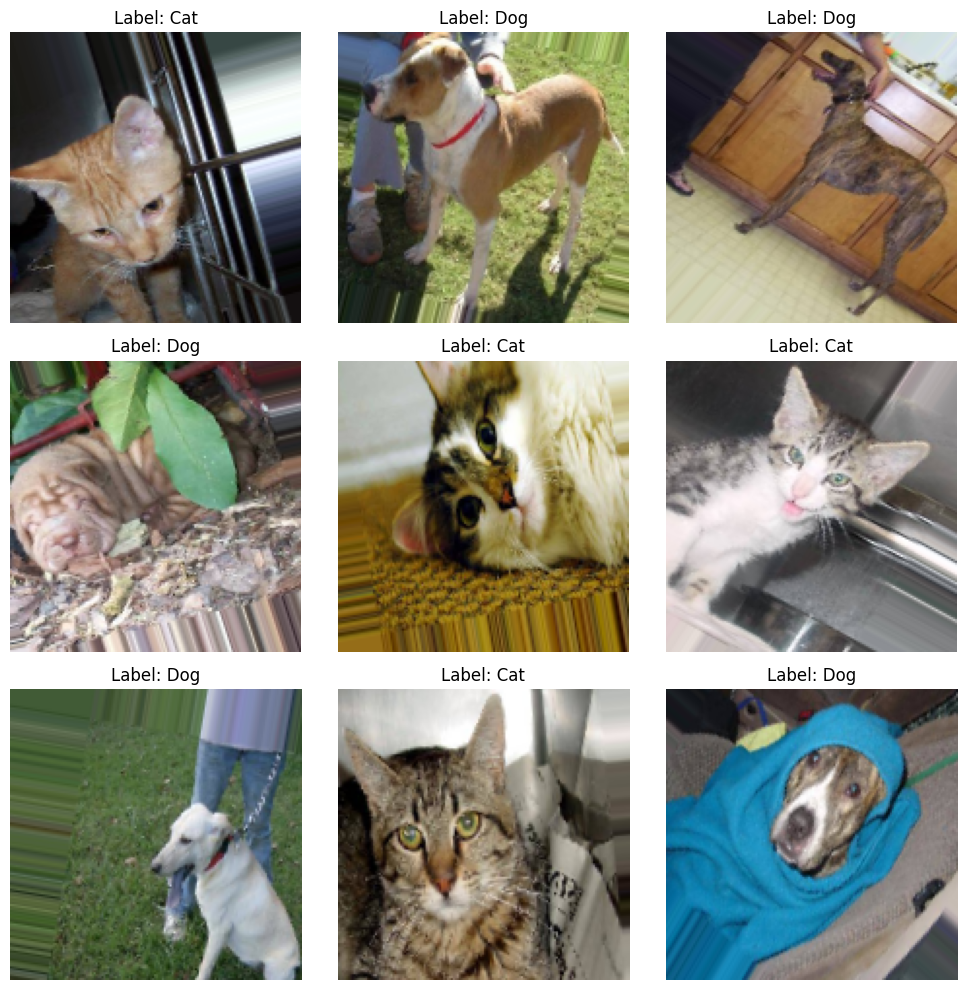

In [ ]:
# mostrar exemplo de imagens geradas

def show_augmented_images(generator, num_images=9):
    images, labels = next(generator)
    plt.figure(figsize=(10, 10))
    for i in range(min(num_images, 9)): # 9 imagens
        plt.subplot(3, 3, i+1)          # grid 3x3
        plt.imshow(images[i])
        plt.title(f'Label: {"Dog" if labels[i] > 0.5 else "Cat"}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

show_augmented_images(train_gen)  # mostrar

# Funções auxiliares para construir os Modelos

<details>
<summary><strong> Integração com o Google Drive para Persistência de Logs e Modelos no Colab </strong> (Explicação)</summary>

Devido às limitações de tempo de execução e GPU do Colab, assim como à necessidade de acompanhar o desempenho de múltiplos modelos, optou-se por utilizar o Google Drive para guardar logs do TensorBoard e modelos treinados.
Esta opção oferece diversas vantagens:
* **Persistência de dados:** os logs e modelos são guardados de forma permanente no seu Drive (sobrevivem ao encerramento da sessão do Colab);
* **Acompanhamento contínuo:** permite visualizar o progresso do treino (através do TensorBoard) e carregar modelos previamente treinados nas futuras sessões;
* **Retomar treinos:** é possível carregar um modelo guardado na drive e continuar o processo de treino de onde parou (economiza tempo e recursos);
* **Organização das diferentes versões e treinos:** s estrutura de diretórios (com nomes de modelos e timestamps) facilita a gestão e comparação de diferentes tentativas de treino.
</details>

<details>
<summary><strong> create_tensorboard_callback </strong> (Explicação)</summary>

Esta função permite configurar o TensorBoard para monitorizar o treino do modelo:
* Cria um callback para o TensorBoard.
* Define o diretório de logs, incluindo nome do modelo e data/hora para facilitar a organização.
* Retorna o callback do TensorBoard e o diretório de logs.
</details>

In [ ]:
def create_tensorboard_callback(model_name):
    log_dir = os.path.join("/content/drive/MyDrive/logs", "dlvc", model_name, datetime.now().strftime("%Y%m%d-%H%M%S"))
    return TensorBoard(log_dir=log_dir), log_dir

<details>
<summary><strong> create_checkpoint_callback </strong> (Explicação)</summary>

Esta função permite guardar o melhor modelo durante o treino num ficheiro `.keras`, nomeado com base no nome do modelo, para fácil identificação:
* Apenas guarda o melhor modelo (evita ficheiros desnecessários)
  * O `ModelCheckpoint` assume automaticamente que deve monitorizar o `val_loss` para determinar o "melhor" modelo a ser salvo.
  * O `val_loss` (validation loss) é a métrica mais indicada para acompanhar durante o treino de um modelo de deep learning, especialmente quando o objetivo é evitar overfitting.
    * `val_loss` reflete melhor a performance em dados novos, pois é calculado em **dados separados dos usados no treino**.
    * Ajuda a **identificar overfitting**, que ocorre **quando o loss diminui, mas o val_loss aumenta ou estabiliza**.
    * É crucial para selecionar o melhor modelo, pois técnicas como early stopping e ModelCheckpoint baseiam-se nele.
* Guarda o modelo completo, não apenas os pesos (permite recarregá-lo diretamente)
* Exibe **mensagens** durante o treino, para acompanhar o processo.
</details>


In [ ]:
def create_checkpoint_callback(model_name):
    checkpoint_path = os.path.join("/content/drive/MyDrive/models", f"{model_name}_best.keras")
    return ModelCheckpoint(
        filepath=checkpoint_path,
        save_best_only=True,
        verbose=1,
        save_weights_only=False  # falso = salva todo o modelo, não apenas os pesos
    )

<details>
<summary><strong> train_model </strong> (Explicação)</summary>

* **Objetivo:** Treinar um modelo de deep learning para classificação de imagens.
* **Nome do modelo:** Combina o tipo de modelo (`model_type`) e a versão (`version`) para criar um nome único para cada versão treinada.
* **Carregamento do modelo:** Existe a opção de carregar um modelo guardado previamente, através do nome. Se não existir, cria um novo modelo (tendo em conta o `model_type`).
* **Callbacks:**
  * `tb_callback`: Configura o `TensorBoard` para monitorizar o treino.
  * `checkpoint`: Guarda o melhor modelo durante o treino num ficheiro `.keras`.
* **Treino:**
  * Usa `model.fit` para treinar o modelo com os dados de treino e validação.
  * Permite especificar o `initial_epoch` e o `total_epochs` (para os casos em que o treino foi interrompido)
* **Avaliação:**
  * `plot_training_history`: Gera gráficos para visualizar o histórico do treino (acurácia e perda).
  * `enhanced_evaluation`: Calcula e apresenta métricas de desempenho, incluindo a matriz de confusão.
  * Adiciona as métricas à lista `model_metrics`.
* **Retorno:** Retorna o modelo treinado e o histórico do treino.


In [ ]:
# função universal para treinar os modelos

def train_model(model_type, version, train_gen, valid_gen, test_gen, initial_epoch=0, total_epochs=30):
    model_name = f"{model_type}_{version}" # guardar nome com tipo e versão

    # indicar modelo
    try:
        model = tf.keras.models.load_model(f"/content/drive/MyDrive/models/{model_name}_best.keras")
        print(f"Loaded {model_name}")
    except:
        if model_type == "CNN":
            model = create_cnn()
        elif model_type == "VGG16":
            model = create_VGG16()
        elif model_type == "EfficientNet":
            model = create_efficientnet()
        else:
            raise ValueError(f"Unknown model type: {model_type}")
        print(f"Created new {model_name}")


    # callbacks
    tb_callback, _ = create_tensorboard_callback(model_name)
    checkpoint = create_checkpoint_callback(model_name)

    # treino
    history = model.fit(
        train_gen,
        initial_epoch=initial_epoch,
        epochs=total_epochs,
        validation_data=valid_gen,
        callbacks=[tb_callback, checkpoint]
    )

    # avaliação (com funções definidas em seguida)
    plot_training_history(history, model_name)
    metrics = enhanced_evaluation(model, test_gen, model_name)
    model_metrics.append(metrics)

    return model, history

<details>
<summary><strong> plot_training_history </strong> (Explicação)</summary>

* Permite visualizar as métricas de treino e validação do modelo.
* Cria um gráfico com duas subplots:
  * Accuracy: Mostra a evolução da acurácia durante o treino, tanto para os dados de treino como de validação.
  * Loss: Mostra a evolução da perda durante o treino, tanto para os dados de treino como de validação.
* Utiliza cores diferentes para distinguir treino e validação.
* Adiciona títulos, legendas e eixos aos gráficos.
* Apresenta o gráfico final.
</details>

In [ ]:
# visualizar métricas de treino e validação

def plot_training_history(history, model_name):

    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(len(acc))

    plt.figure(figsize=(12, 5))

    # plot 1: accuracy
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'r', label='Training')
    plt.plot(epochs, val_acc, 'b', label='Validation')
    plt.title(f'{model_name} Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend()
    plt.grid(True)

    # plot 2: loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'r', label='Training')
    plt.plot(epochs, val_loss, 'b', label='Validation')
    plt.title(f'{model_name} Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

<details>
<summary><strong> enhanced_evaluation </strong> (Explicação)</summary>

* Carrega os melhores pesos do modelo (se disponíveis).
* Faz previsões com o modelo (usa os dados de teste).
* Gera uma **matriz de confusão** (`heatmap`), que evidencia, visualmente, o desempenho do modelo em cada classe.
* Calcula e apresenta um **relatório de classificação** (inclui precisão, recall e F1-score)
* Calcula e apresenta métricas adicionais como acurácia, precisão, recall e F1-score.
* Retorna um dicionário contendo as métricas calculadas.

</details>

In [ ]:
# avaliação final
def enhanced_evaluation(model, test_gen, model_name):
    try:
        model.load_weights(f"/content/drive/MyDrive/models/{model_name}_best.keras")
    except Exception as e:
        print(f"Warning: Couldn't load weights - {e}. Using last weights.")

    # reset generator
    test_gen.reset()
    predictions = model.predict(test_gen)
    predicted_classes = (predictions > 0.5).astype("int32")
    true_classes = test_gen.classes
    class_names = list(test_gen.class_indices.keys())

    # confusion matrix
    plt.figure(figsize=(6,5))
    cm = confusion_matrix(true_classes, predicted_classes)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    # classification report (com outuput dict com métricas)
    print(f"\n{class_names[0].upper()} vs {class_names[1].upper()} Report:")
    report = classification_report(true_classes, predicted_classes,
                                 target_names=class_names,
                                 output_dict=True,
                                 digits=4)
    print(classification_report(true_classes, predicted_classes,
                              target_names=class_names, digits=4))

    # retornar métricas essenciais
    return {
        'accuracy': report['accuracy'],
        'precision': report['weighted avg']['precision'],
        'recall': report['weighted avg']['recall'],
        'f1': report['weighted avg']['f1-score']
    }

<details>
<summary><strong> load_model </strong> (Explicação)</summary>

A função load_model tem como objetivo carregar um modelo Keras que foi previamente treinado e guardado no Google Drive.

Passo-a-passo:
* Define o caminho do modelo:`model_path = f"/content/drive/MyDrive/models/{model_name}_best.keras"`. Este é o caminho completo para o ficheiro do modelo no Google Drive, usando f-strings para formatar o nome do modelo com nome e timestamp e sufixo `_best.keras`.

* Tenta carregar o modelo:
  * `try...except`: Este bloco tenta carregar o modelo usando `tf.keras.models.load_model(model_path)`. Se o modelo for encontrado e carregado com sucesso, imprime uma mensagem de sucesso e retorna o modelo.
  * Por outro lado, também lida com possíveis erros: `except FileNotFoundError` caso o ficheiro do modelo pedido não seja encontrado no caminho especificado, imprime uma mensagem de erro e retorna `None`.
</details>

In [ ]:
def load_model(model_name):
  model_path = f"/content/drive/MyDrive/models/{model_name}_best.keras"
  try:
    model = tf.keras.models.load_model(model_path)
    print(f"Modelo {model_name} carregado com sucesso!")
    return model
  except FileNotFoundError:
    print(f"Erro: Modelo {model_name} não encontrado em {model_path}")
    return None

<details>
<summary><strong> plot_model_comparison </strong> (Explicação)</summary>

1. Define as métricas a serem comparadas: metrics = ['accuracy', 'precision', 'recall', 'f1'].
2. Cria uma figura para os gráficos: `plt.figure(figsize=(15, 10))`:
3. Itera pelas métricas, criando um gráfico de barras para cada uma:
  * `plt.subplot(2, 2, i+1)`: Cria um subplot (subgráfico) dentro da figura, organizando os gráficos em uma grade 2x2.
  * `values = [m[metric] for m in model_metrics]`: Extrai os valores da métrica atual para cada modelo da lista model_metrics.
  * `sns.barplot(x=model_names, y=values)`: Cria o gráfico de barras usando a biblioteca Seaborn, com os nomes dos modelos no eixo x e os valores da métrica no eixo y.
4. Exibe a figura com todos os gráficos: `plt.show()`.
</details>

In [ ]:
# comparação dos modelos

def plot_model_comparison(model_metrics, model_names):
    metrics = ['accuracy', 'precision', 'recall', 'f1']
    plt.figure(figsize=(10, 8))

    for i, metric in enumerate(metrics):
        plt.subplot(2, 2, i+1)
        values = [m[metric] for m in model_metrics]
        sns.barplot(x=model_names, y=values, palette="viridis")
        plt.title(f'{metric.capitalize()}', fontsize=10, fontweight='bold')
        plt.ylim(0.5, 1.0)
        plt.ylabel('Score')
        plt.xlabel('Modelos')
        plt.xticks(rotation=0)

    plt.suptitle('Comparação dos Modelos', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# TensorBoard

In [ ]:
# extensão TensorBoard

%load_ext tensorboard

In [ ]:
# iniciar TensorBoard (diretório logs/fit)

%tensorboard --logdir /content/drive/MyDrive/logs/dlvc

<IPython.core.display.Javascript object>

# Arquitetura dos Modelos

###  Modelo 1: CNN


<details>
<summary><strong> Modelo CNN </strong> (Conceito geral)</summary>

* Rede neural convolucional projetada para processar dados com estrutura em grid/imagens.
* Utiliza camadas convolucionais para extrair características hierárquicas.
* Camadas de pooling reduzem a dimensionalidade espacial.
* Camadas densas para a classificação final.

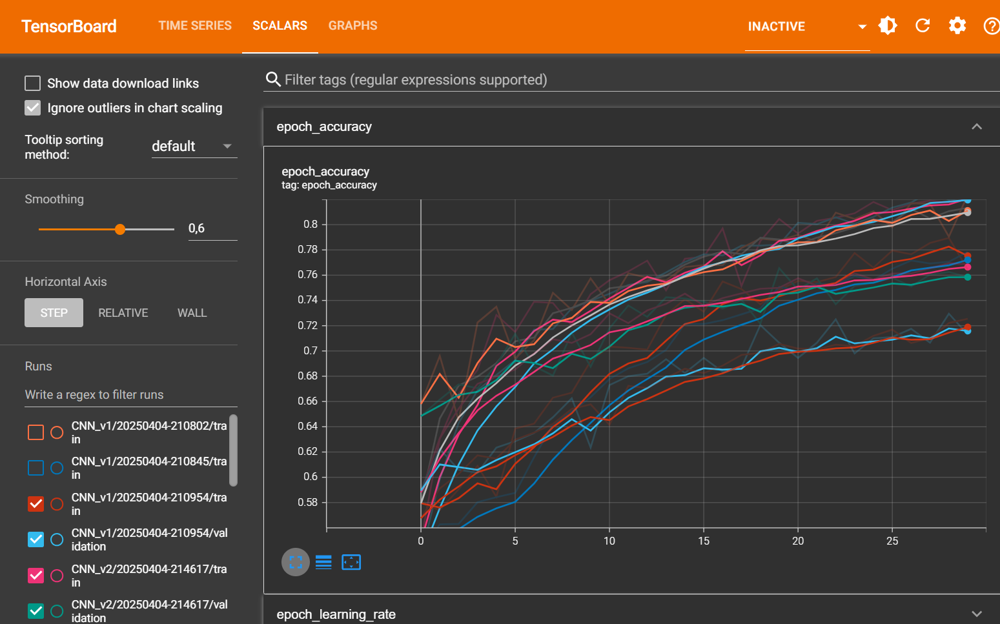
</details>

***Evolução do modelo***
<details>
<summary><strong> CNN_v1 </strong> (Expandir)</summary>

* **Arquitetura inicial:**
  * CNN básica com duas camadas convolucionais (16 e 32 filtros, respetivamente) e duas camadas densas para classificação.
  * Sem camadas de pooling.
  * Função de ativação ReLU nas camadas convolucionais e na primeira camada densa.
  * Função de ativação Sigmoid na camada de saída para classificação binária.
  * Otimizador Adam com learning rate padrão.
  * Função de perda binary crossentropy.
  * Métrica de avaliação: accuracy

* **Parâmetros:**
  * Total de parâmetros: 43.660.385
  * Parâmetros treináveis: 43.660.385
  * Parâmetros não treináveis: 0
  * **Muitos parâmetros** devido ao Flatten logo após convoluções (sem pooling).
* **Performance:**
  * accuracy de ~74.5%;
  * precisão e recall equilibradas, logo possuem pontuações F1 semelhantes para gatos e cães. Indica um bom desempenho geral do modelo na tarefa de classificação.
</details>


<details>
<summary><strong> CNN_v2 (com Pooling) </strong> (Expandir)</summary>

* **Principais alterações:** foram adicionadas camadas MaxPooling2D após cada camada convolucional.
* **Arquitetura:** 2 blocos (Conv2D + MaxPooling2D) com 16 e 32 filtros, seguidos por Flatten, 1 camada densa (64 neurónios) e camada de saída.
* **Número de parâmetros** significativamente menor (2659425 parametros).
* **Performance:**
  * Accuracy melhorada para ~78.2%.
  * Precisão e Recall continuam equilibrados, o que resulta em pontuações F1 semelhantes.
  * `MaxPooling` ajudou na generalização.
</details>


<details>
<summary><strong> CNN_v3 (extra camada convolucional) </strong> (Expandir)</summary>

* **Principais alterações:** foi adicionada uma camada convolucional (64 filtros) seguida por MaxPooling.
* Arquitetura: 3 blocos (`Conv2D` + `MaxPooling2D`) com 16, 32 e 64 filtros, seguidos por Flatten, 1 camada densa (64 neurónios) e camada de saída.
* O **número de parâmetros** diminuiu para 1207457.
* **Performance:**
  * Melhoria substancial na accuracy para ~84.1%. Mais profundidade permitiu aprender características mais complexas;
  * O modelo está a classificar cães e gatos com bastante precisão e eficácia. A pontuação F1, que combina precisão e recall, é alta para ambas as classes, sendo ligeiramente melhor para cães. Isso significa que o modelo tem um bom desempenho geral, com um ligeiro favoritismo na classificação de cães.
</details>


<details>
<summary><strong> CNN_v4 (final) </strong> (Expandir)</summary>

* **Principais alterações:** Adição de camadas `BatchNormalization` após cada camada convolucional e na camada densa, e ajuste do `Dropout` para 0.3.
* **Arquitetura:** 3 blocos (`Conv2D` + `BatchNormalization` + `MaxPooling2D`) com 16, 32 e 64 filtros; Flatten; 1 camada densa (64 neurónios) com `BatchNormalization` e `Dropout(0.3)`; Camada de saída.
* Parâmetros:
  * Total de parâmetros: 1.208.161
  * Parâmetros treináveis: 1.207.809
  * Parâmetros não treináveis: 352
  * O número de parâmetros é ligeiramente maior que a v3 devido à introdução das camadas de `BatchNormalization` (que adicionam parâmetros treináveis para escala e bias por feature map).
* Performance:
  * Accuracy de ~85.0%.
  * Para a classe gatos: precisão 0.9167; Recall 0.7700; F1-score: 0.8370.
  * Para a classe cães: precisão 0.8017; Recall: 0.9300; F1-score: 0.8611.
  * A adição de `BatchNormalization` ajudou a estabilizar o treino e permitiu alcançar uma accuracy ligeiramente superior à da v3.

  * O modelo demonstra uma boa capacidade de generalização, embora se esperem e se verifiquem melhores resultados com os modelos pré-treinados.
  * Observa-se um desequilíbrio na precisão e recall entre as classes, sugerindo que o modelo tem uma maior tendência a classificar imagens como cães (maior recall para cães, menor recall para gatos).
</details>

***Quadro resumo: classification report***

| modelo | accuracy | precision | recall | f1 score |
|---|---|---|---|---|
| v1 | 0.7450 | 0.7478 | 0.7450 | 0.7443 |
| v2 | 0.7820 | 0.7822 | 0.7820 | 0.7820 |
| v3 | 0.8410 | 0.8455 | 0.8410 | 0.8405 |
| v4 | 0.8500 | 0.8592 | 0.8500 | 0.8490 |

In [ ]:
model_metrics = []

In [ ]:
# nova versão 4 - Melhorada

def create_cnn(input_shape=(150, 150, 3)):
    model = Sequential([

        # Camada 1: Convolução + BatchNormalization + Pooling
        Conv2D(16, (3,3), activation='relu', input_shape=input_shape),
        BatchNormalization(),
        MaxPooling2D(2,2),

        # Camada 2: Convolução + BatchNormalization + Pooling
        Conv2D(32, (3,3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2,2),

        # Camada 3: Convolução + BatchNormalization + Pooling
        Conv2D(64, (3,3), activation='relu'),
        BatchNormalization(),
        MaxPooling2D(2,2),

        Flatten(),

        # Camada densa com BatchNormalization e Dropout ajustado
        Dense(64, activation='relu'),
        BatchNormalization(),
        Dropout(0.3),  # menor

        # Camada de saída
        Dense(1, activation='sigmoid')
        ])

    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(),
        metrics=['accuracy']
    )
    print("CNN Summary (v4 - melhorada):")
    model.summary()
    return model

CNN Summary (v4 - melhorada):


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)                    │ (None, 148, 148, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 148, 148, 16)        │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 72, 72, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 72, 72, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 34, 34, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 34, 34, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 17, 17, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 18496)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 64)                  │       1,183,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,208,161 (4.61 MB)

 Trainable params: 1,207,809 (4.61 MB)

 Non-trainable params: 352 (1.38 KB)

Created new CNN_v4
Epoch 1/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 201ms/step - accuracy: 0.5871 - loss: 0.7837
Epoch 1: val_loss improved from inf to 1.59405, saving model to /content/drive/MyDrive/models/CNN_v4_best.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 75s 267ms/step - accuracy: 0.5872 - loss: 0.7834 - val_accuracy: 0.5000 - val_loss: 1.5940
Epoch 2/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.6371 - loss: 0.6432
Epoch 2: val_loss improved from 1.59405 to 0.82783, saving model to /content/drive/MyDrive/models/CNN_v4_best.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 63s 253ms/step - accuracy: 0.6372 - loss: 0.6432 - val_accuracy: 0.5570 - val_loss: 0.8278
Epoch 3/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.6812 - loss: 0.5919
Epoch 3: val_loss improved from 0.82783 to 0.57230, saving model to /content/drive/MyDrive/models/CNN_v4_best.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 83s 255ms/step - accuracy: 0.6812 - loss: 0.5919 - val_accuracy: 0.6990 - val_loss: 0.5723
Epoch 4/30
25

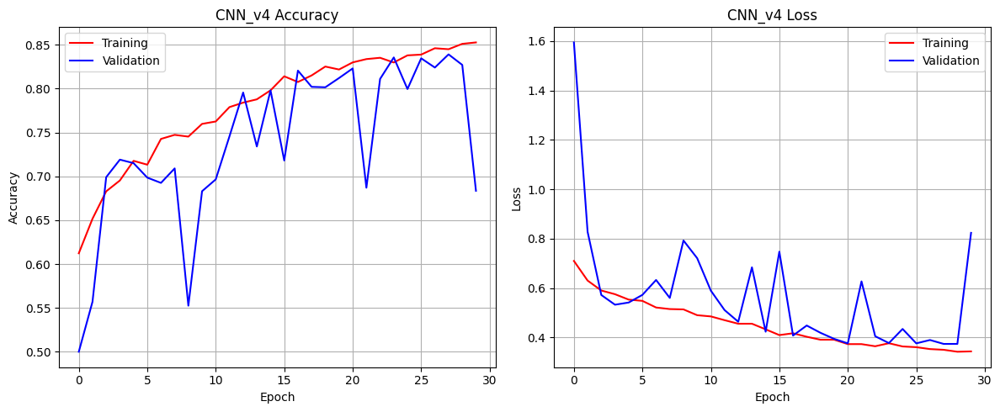

32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step


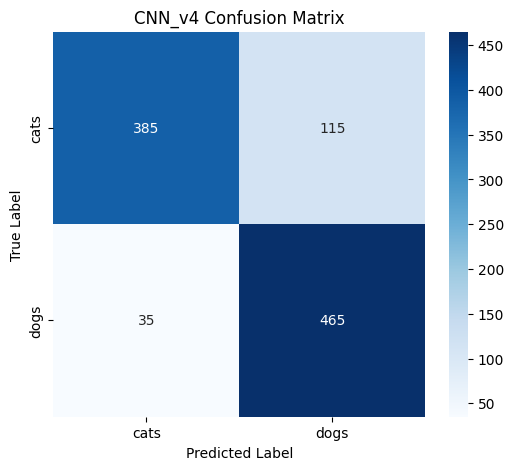


CATS vs DOGS Report:
              precision    recall  f1-score   support

        cats     0.9167    0.7700    0.8370       500
        dogs     0.8017    0.9300    0.8611       500

    accuracy                         0.8500      1000
   macro avg     0.8592    0.8500    0.8490      1000
weighted avg     0.8592    0.8500    0.8490      1000



In [ ]:
# Version 4 (Deeper Architecture com dropout menor)
model_cnn_v4, history_cnn_v4 = train_model("CNN", "v4", train_gen, valid_gen, test_gen)

## Modelo 2: Transfer Learning (VGG16)

<details>
<summary><strong> Modelo VGG16 </strong> (Conceito geral)</summary>

Primeiro, foi implementado o modelo VGG16 v1 utilizando transfer learning, com uma base VGG16 congelada e algumas camadas densas adicionadas, resultando em uma acurácia de aproximadamente 98.5%.

**Arquitetura:**
* Base VGG16 pré-treinada (congelada) - foi necessário ajustar o tamanho das imagens de entrada para 224x224, de forma a manter os pesos originais congelados;
* Camada Flatten para transformar a saída da base em um vetor;
* Camada Densa com 256 neurônios e ativação ReLU;
* Camada Dropout com taxa de 0.5 para regularização.
* Camada Densa de saída com 1 neurônio e ativação Sigmoid (para classificação binária).

**Parâmetros:**
* Total: 21,137,729
* Treináveis: 6,423,041 (apenas as camadas adicionadas)
* Não treináveis: 14,714,688 (pesos da base VGG16 congelados)

**Performance:**
* **Excelente Performance:** O modelo VGG16 demonstra uma performance notavelmente alta (accuracy de ~98.5%) na classificação de cães e gatos.
* **Transfer Learning é eficaz:** O uso de transfer learning com a arquitetura VGG16 pré-treinada foi altamente eficaz para esta tarefa. Permitiu alcançar uma alta precisão com relativamente pouco treino nas camadas adicionadas. Proporcionou uma performance significativamente superior aos modelos CNN construídos do zero.
* **Baixos Erros:** o número de falsos positivos e falsos negativos é muito baixo, o que indica que o modelo raramente comete erros de classificação;
* **Equilíbrio entre Classes:** as métricas são muito semelhantes para ambas as classes (gatos e cães), o que sugere que o modelo não tem um viés significativo para nenhuma das classes;
</details>









In [ ]:
# Model 2: VGG16

def create_VGG16(input_shape=(224, 224, 3)):
    base_model = tf.keras.applications.VGG16(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )
    base_model.trainable = False

    model = Sequential([
        base_model,
        Flatten(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])

    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(learning_rate=1e-4),
        metrics=['accuracy']
    )
    print("\nTransfer Learning - VGG16 Summary:")
    model.summary()
    return model

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

Transfer Learning - VGG16 Summary:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 21,137,729 (80.63 MB)

 Trainable params: 6,423,041 (24.50 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Created new VGG16_v1
Epoch 1/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 444ms/step - accuracy: 0.8236 - loss: 2.4135
Epoch 1: val_loss improved from inf to 0.23799, saving model to /content/drive/MyDrive/models/VGG16_v1_best.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 163s 584ms/step - accuracy: 0.8238 - loss: 2.4088 - val_accuracy: 0.9255 - val_loss: 0.2380
Epoch 2/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 435ms/step - accuracy: 0.8975 - loss: 0.3727
Epoch 2: val_loss improved from 0.23799 to 0.16066, saving model to /content/drive/MyDrive/models/VGG16_v1_best.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 137s 546ms/step - accuracy: 0.8975 - loss: 0.3725 - val_accuracy: 0.9375 - val_loss: 0.1607
Epoch 3/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 441ms/step - accuracy: 0.9154 - loss: 0.2242
Epoch 3: val_loss did not improve from 0.16066
250/250 ━━━━━━━━━━━━━━━━━━━━ 137s 549ms/step - accuracy: 0.9154 - loss: 0.2242 - val_accuracy: 0.9330 - val_loss: 0.1634
Epoch 4/30
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 438ms/step - accuracy: 0.9220 

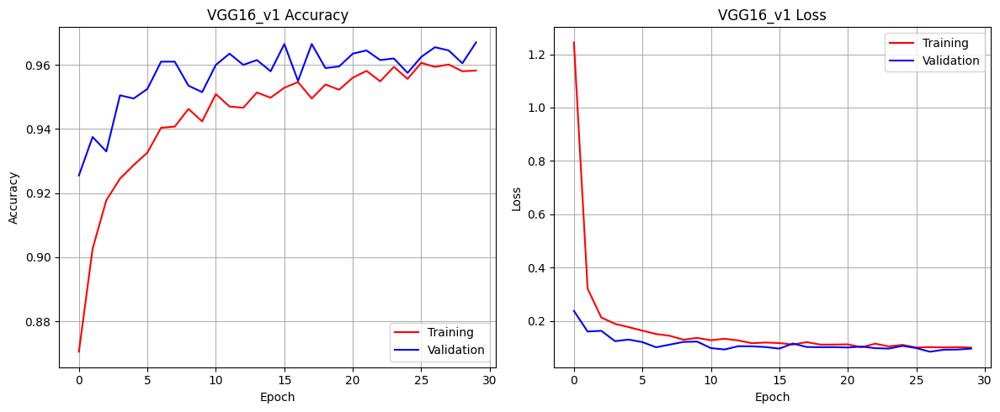

32/32 ━━━━━━━━━━━━━━━━━━━━ 10s 300ms/step


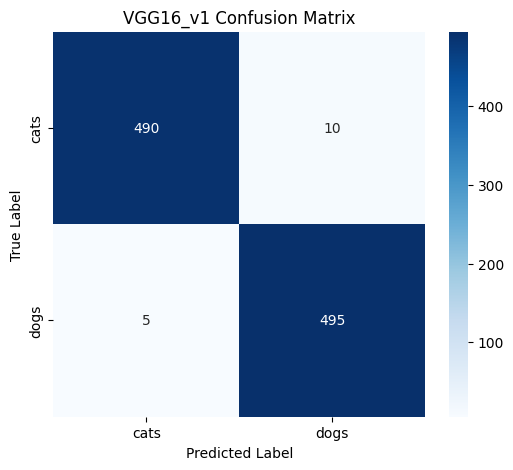


CATS vs DOGS Report:
              precision    recall  f1-score   support

        cats     0.9899    0.9800    0.9849       500
        dogs     0.9802    0.9900    0.9851       500

    accuracy                         0.9850      1000
   macro avg     0.9850    0.9850    0.9850      1000
weighted avg     0.9850    0.9850    0.9850      1000



In [ ]:
# Treino + chamar modelo com entrada 224x224

model_vgg, history_vgg = train_model("VGG16", "v1", train_gen_224, valid_gen_224, test_gen_224)

## Modelo 3: Transfer Learning (EfficientNetB0)


***Evolução do modelo***
<details>
<summary><strong> EfficientNet_v1 </strong> (Expandir)</summary>

Este modelo, tal como o VGG16, vai usar uma immagem de entrada com tamanho 224x224

**Arquitetura Inicial:**
* Base EfficientNetB0 pré-treinada (congelada).
* GlobalAveragePooling2D.
* Camada Densa com 256 neurónios (ReLU).
* Camada Dropout (0.5).
* Camada Densa de saída com 1 neurónio (Sigmoid).

**Parâmetros:**
* Total: 4,377,764
* Treináveis: 328,193
* Não Treináveis: 4,049,571

**Performance:**
* Accuracy de ~99.6%.
* Erros de classificação muito baixos (2 FP, 2 FN).
* Performance equilibrada entre as classes de cães e gatos.
* Demonstrou alta eficácia do transfer learning com EfficientNetB0.
* Gráficos de treino sugeriram overfitting após algumas epochs. Como indica que o treino poderia ter sido interrompido mais cedo, diminuiu-se o número de epochs numa nova versão do modelo.
</details>


<details>
<summary><strong> EfficientNet_v2 </strong> (Expandir)</summary>

**Principal alteração:**
* Diminuir o número de Epochs do treino para apenas 10 epochs, em resposta à observação da estabilização e overfitting da v1. O objetivo era alcançar uma boa performance com um treino mais curto e evitar a memorização dos dados de treino.


**Performance:**
* Accuracy de ~99.6%.
* Erros de classificação também muito baixos (4 FP e 0 FN).
* Performance geral idêntica à da v1 em termos de accuracy. No entanto, surgiu um ligeiro desequilíbrio nos erros de classificação em comparação com a v1 (mais falsos positivos para a classe "cães").

Atingiu uma performance excelente com um número significativamente menor de epochs, demonstrando uma convergência rápida e eficiente. No entanto, deixou de ter melhorias cedo no treino, o que levou a fazer uma nova versãop de treino, com ainda menos epochs.

</details>

<details>
<summary><strong> EfficientNet_v3.2 </strong> (Expandir)</summary>

**Principal alteração:**
* Utilizar um número de epochs menor. Nesta versão foram realizadas 5 epochs.

**Performance:**
* Demonstra uma performance muito alta (Accuracy 99.50%) mesmo com um número extremamente reduzido de epochs
* Apresenta um ligeiro desequilíbrio nos erros de classificação, com 4 falsos positivos para a classe "cães" e apenas 1 falso negativo para a classe "cães".
* Sugere que o modelo `EfficientNetB0` com transfer learning consegue aprender as características distintivas das classes de forma muito rápida!

</details>



<details>
<summary><strong> Comparação entre versões </strong> (Expandir)</summary>

**Métricas de Desempenho:**

* Todas as versões alcançaram 99.5-99.6% de accuracy no conjunto de teste, com precisão, recall e F1-scores identicos para ambas as classes (gatos e cães).
* As matrizes de confusão para a v1 (30 épocas) e a v3 (15 épocas) mostram os mesmos resultados:
  * Gatos: 498 classificados corretamente, 2 classificados incorretamente como cães.
  * Cães: 498 classificados corretamente, 2 classificados incorretamente como gatos.
* A v2 (10 épocas) teve um desempenho ligeiramente diferente:
  * Gatos: 496 classificados corretamente, 4 classificados incorretamente como cães.
  * Cães: 500 classificados corretamente, 0 classificados incorretamente como gatos.
* A v3.2 (5 épocas) teve um desempenho ligeiramente diferente:
  * Gatos: 496 classificados corretamente, 4 classificados incorretamente como cães.
  * Cães: 499 classificados corretamente, 1 classificados incorretamente como gato.

**Dinâmica de Treino:**

* v1 (30 épocas): Alta precisão inicial com sinais de saturação e potencial overfitting tardio.
* v2 (10 épocas): Convergência rápida com boa performance, mas sem melhorias significativas após poucas épocas.
* v3.2 (5 épocas): Demonstra uma aprendizagem extremamente rápida, atingindo uma precisão muito alta em poucas épocas.

**Eficiência:**
* A v3.2 (5 épocas) é a mais eficiente em termos de tempo de treino, alcançando uma precisão muito alta com o menor número de epochs e resultados semelhantes.
* A v2 (10 épocas) também é muito eficiente.
* A v1 (30 épocas) é a menos eficiente devido ao maior número de epochs sem ganhos significativos.


**Recomendações:**

* A v3.2 (5 épocas) surge como a opção mais eficiente para este cenário, oferecendo uma precisão muito alta com um custo computacional mínimo.
* A v2 (10 épocas) também é uma excelente escolha, com uma precisão ligeiramente superior à v3.2.
* A v1 (30 épocas) deve ser evitada devido à sua ineficiência em termos de tempo de treino.


**Notas Finais:**

* A capacidade do `EfficientNetB0` com transfer learning de atingir uma alta precisão em poucas épocas é notável.
* Para aplicações com restrições de tempo ou recursos computacionais, a v3.2 (5 épocas) representa uma solução muito eficaz.
* A ligeira variação no padrão de erros entre as versões pode ser investigada mais a fundo, mas a performance geral permanece excelente.








In [ ]:
def create_efficientnet(input_shape=(224, 224, 3)):
    base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False
    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(256, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid', name='output_layer')
    ])
    model.compile(optimizer=Adam(1e-3), loss='binary_crossentropy', metrics=['accuracy'])
    print("\nTransfer Learning - EfficientNetB0 Summary:")
    model.summary()
    return model


Transfer Learning - EfficientNetB0 Summary:


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 256)                 │         327,936 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output_layer (Dense)                 │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,377,764 (16.70 MB)

 Trainable params: 328,193 (1.25 MB)

 Non-trainable params: 4,049,571 (15.45 MB)

Created new EfficientNet_v3.2
Epoch 1/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 398ms/step - accuracy: 0.9536 - loss: 0.1181
Epoch 1: val_loss improved from inf to 0.03763, saving model to /content/drive/MyDrive/models/EfficientNet_v3.2_best.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 156s 541ms/step - accuracy: 0.9537 - loss: 0.1180 - val_accuracy: 0.9855 - val_loss: 0.0376
Epoch 2/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - accuracy: 0.9752 - loss: 0.0644
Epoch 2: val_loss did not improve from 0.03763
250/250 ━━━━━━━━━━━━━━━━━━━━ 198s 566ms/step - accuracy: 0.9752 - loss: 0.0644 - val_accuracy: 0.9795 - val_loss: 0.0533
Epoch 3/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step - accuracy: 0.9846 - loss: 0.0459
Epoch 3: val_loss improved from 0.03763 to 0.02974, saving model to /content/drive/MyDrive/models/EfficientNet_v3.2_best.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 141s 566ms/step - accuracy: 0.9845 - loss: 0.0459 - val_accuracy: 0.9875 - val_loss: 0.0297
Epoch 4/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 401ms/s

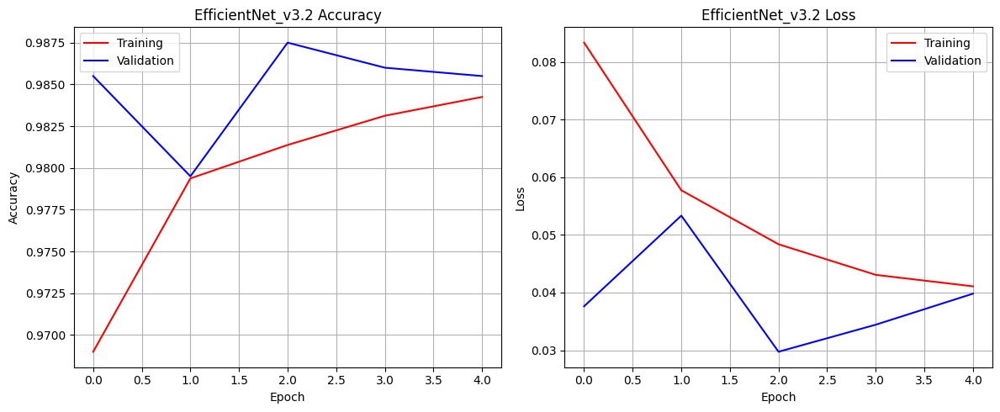

32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 242ms/step


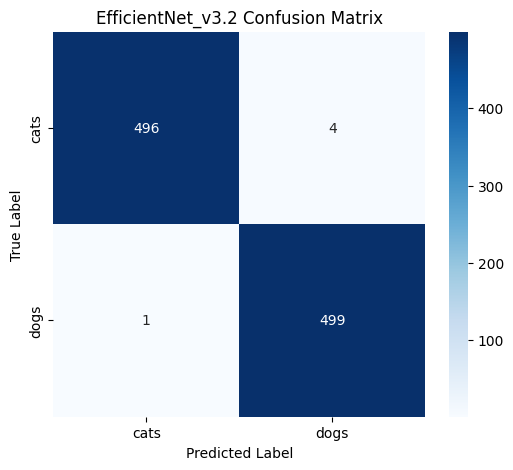


CATS vs DOGS Report:
              precision    recall  f1-score   support

        cats     0.9980    0.9920    0.9950       500
        dogs     0.9920    0.9980    0.9950       500

    accuracy                         0.9950      1000
   macro avg     0.9950    0.9950    0.9950      1000
weighted avg     0.9950    0.9950    0.9950      1000



In [ ]:
# Treino com menos epochs + chamar modelo com entrada 224x224

model_effnet, history_effnet = train_model("EfficientNet", "v3.2", train_gen_224, valid_gen_224, test_gen_224, total_epochs=5)

# Model Comparison

Modelo CNN_v4 carregado com sucesso!
Modelo CNN carregado: <Sequential name=sequential_1, built=True>
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step


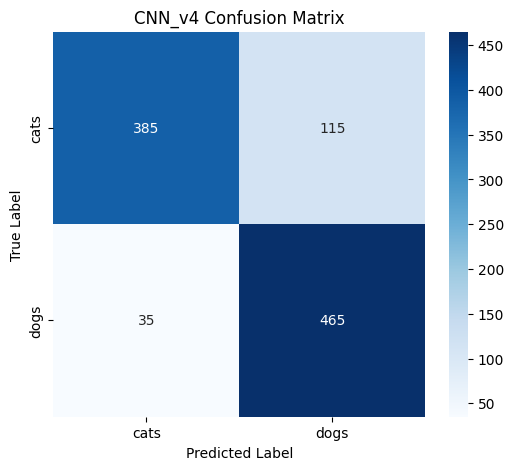


CATS vs DOGS Report:
              precision    recall  f1-score   support

        cats     0.9167    0.7700    0.8370       500
        dogs     0.8017    0.9300    0.8611       500

    accuracy                         0.8500      1000
   macro avg     0.8592    0.8500    0.8490      1000
weighted avg     0.8592    0.8500    0.8490      1000

Modelo VGG16_v1 carregado com sucesso!
Modelo VGG16 carregado: <Sequential name=sequential, built=True>
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step


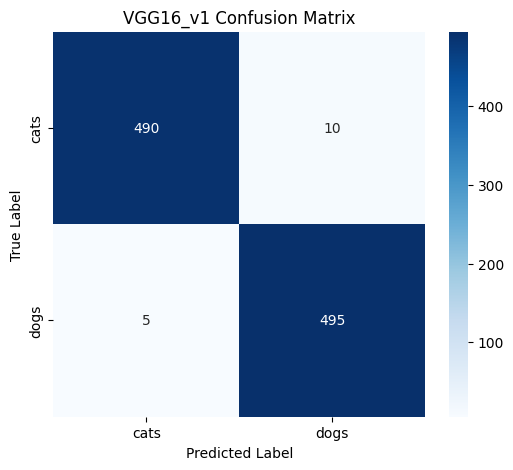


CATS vs DOGS Report:
              precision    recall  f1-score   support

        cats     0.9899    0.9800    0.9849       500
        dogs     0.9802    0.9900    0.9851       500

    accuracy                         0.9850      1000
   macro avg     0.9850    0.9850    0.9850      1000
weighted avg     0.9850    0.9850    0.9850      1000

Modelo EfficientNet_v3.2 carregado com sucesso!
Modelo EfficientNet carregado: <Sequential name=sequential_1, built=True>
32/32 ━━━━━━━━━━━━━━━━━━━━ 14s 272ms/step


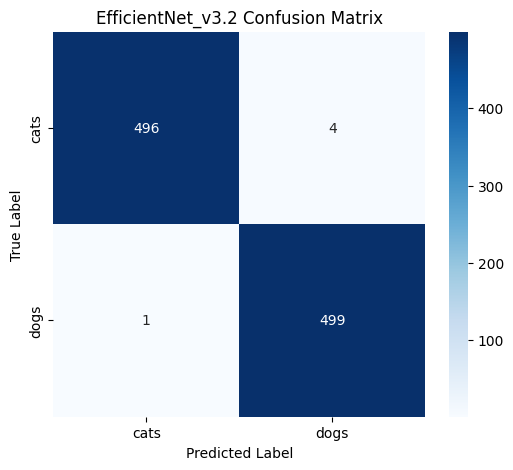


CATS vs DOGS Report:
              precision    recall  f1-score   support

        cats     0.9980    0.9920    0.9950       500
        dogs     0.9920    0.9980    0.9950       500

    accuracy                         0.9950      1000
   macro avg     0.9950    0.9950    0.9950      1000
weighted avg     0.9950    0.9950    0.9950      1000



In [ ]:
# load modelos (guardados na drive) e guardar métricas

model_metrics = []

# carregar os modelo CNN
modelo_cnn = load_model("CNN_v4")
print(f'Modelo CNN carregado: {modelo_cnn}')
# avaliar e guardar métricas
model_metrics.append(enhanced_evaluation(modelo_cnn, test_gen, "CNN_v4"))

# carregar os modelo VGG
modelo_vgg = load_model("VGG16_v1")
print(f'Modelo VGG16 carregado: {modelo_vgg}')
# avaliar e guardar métricas
model_metrics.append(enhanced_evaluation(modelo_vgg, test_gen_224, "VGG16_v1"))

# carregar os modelo EfficientNet
modelo_effnet = load_model("EfficientNet_v3.2")
print(f'Modelo EfficientNet carregado: {modelo_effnet}')
# avaliar e guardar métricas
model_metrics.append(enhanced_evaluation(modelo_effnet, test_gen_224, "EfficientNet_v3.2"))

# lista com os nomes dos modelos escolhidos
model_names = ["CNN_v4", "VGG16_v1", "EfficientNet_v3.2"]

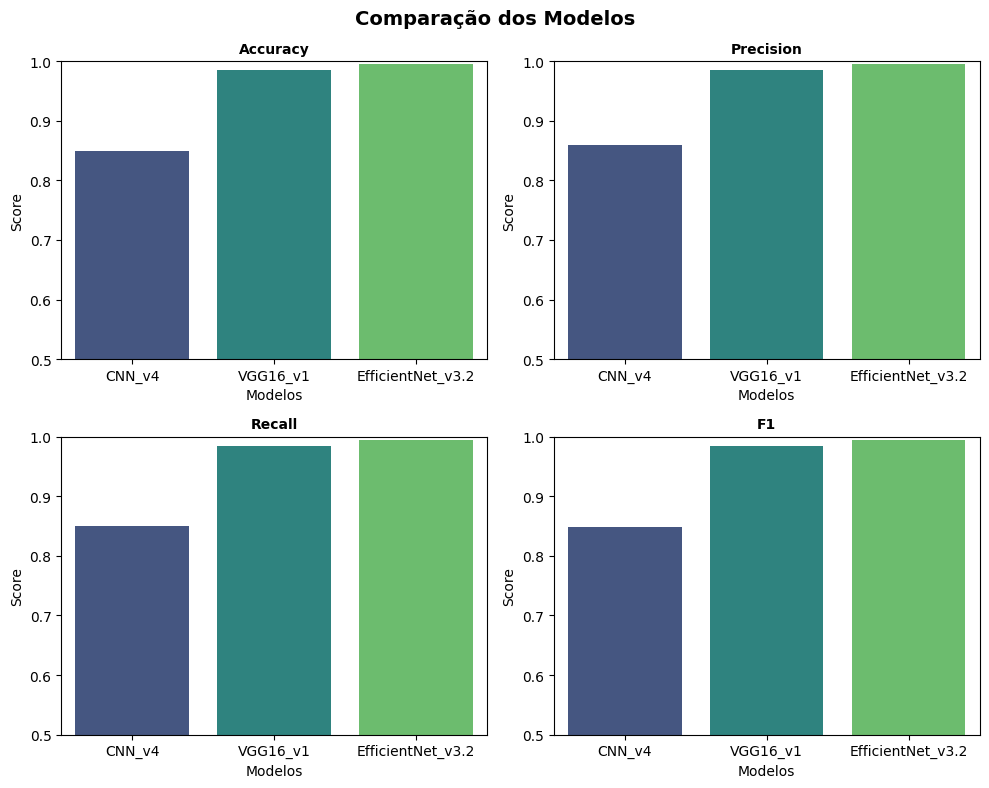

In [ ]:
# chamar a função para mostrar a comparação final (aviso: é necessário dar load aos modelos)

plot_model_comparison(model_metrics, model_names)

<details>
<summary><strong> Model Comparison </strong> (Explicação)</summary>

Os resultados obtidos indicam que o modelo EfficientNet_v3.2 apresenta um melhor desempenho do que os modelos CNN_v4 e VGG16_v1 em todas as métricas avaliadas:

*  **Accuracy:** O EfficientNet_v3.2 alcança a maior accuracy, indicando que ele classifica corretamente uma maior proporção das amostras.

*   **Precision:** O EfficientNet_v3.2 também demonstra a maior precisão, o que significa que, quando ele prevê uma classe positiva, essa previsão tem uma alta probabilidade de estar correta.

*   **Recall:** Similarmente, o EfficientNet_v3.2 obtém o maior recall, sugerindo que ele é capaz de identificar uma proporção maior de todas as amostras positivas reais.

*   **F1-Score:** O EfficientNet_v3.2 apresenta o maior F1-Score, que é a média harmônica da precisão e do recall. Isso reforça que ele possui um bom equilíbrio entre precisão e recall.

Em resumo, com base nestas métricas, o modelo EfficientNet_v3.2 parece ser a melhor escolha entre os três modelos comparados.

# Funcionalidades

<details>
<summary><strong> show_sample_predictions </strong> (Explicação)</summary>

* **Funcionalidade:** Mostrar previsões de amostras do modelo.
* **Entrada:** Modelo, gerador de dados de teste, número de amostras.
* **Ações:**
  * Obtém amostras do gerador de teste.
  * Faz previsões com o modelo.
  * Mostra imagens com etiquetas verdadeiras e previstas.
  * Usa cores para indicar se a previsão está correta.
* **Saída:** Visualização das previsões.

In [ ]:
# funcionalidade 1: mostrar previsões (aviso: é necessário dar load aos modelos)

def show_sample_predictions(model, test_gen, num_samples=5):
    test_gen.reset()
    x, y = next(test_gen)
    predictions = model.predict(x)

    plt.figure(figsize=(15, 5))
    for i in range(num_samples):
        plt.subplot(1, num_samples, i+1)
        # rescale antes de mostrar
        image = x[i] / 255.0  # [0-1]
        plt.imshow(image)
        pred_label = 'dog' if predictions[i] > 0.5 else 'cat'
        true_label = 'dog' if y[i] == 1 else 'cat'
        color = 'green' if pred_label == true_label else 'red'
        plt.title(f"True: {true_label}\nPred: {pred_label}", color=color)
        plt.axis('off')
    plt.suptitle("Previsões", fontsize=14, fontweight='bold', y=0.9)
    plt.tight_layout()
    plt.show()


Previsões:
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


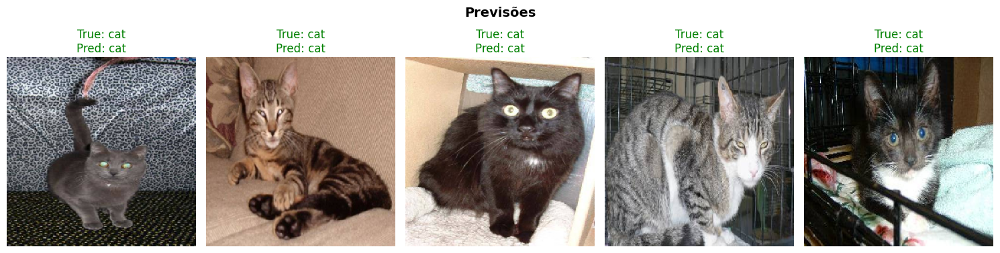

In [ ]:
print("\nPrevisões:")

show_sample_predictions(modelo_effnet, test_gen_224)

<details>
<summary><strong> display_misclassified_images </strong> (Explicação)</summary>

* **Funcionalidade:** Exibir imagens que o modelo classificou incorretamente, com as etiquetas verdadeiras e as previsões do modelo.

* **Entrada da função:**
  * **model:** O modelo treinado que será usado para fazer as previsões.
  * **test_gen_224**: Um gerador de dados Keras para o conjunto de teste, que deve fornecer as imagens e as etiquetas verdadeiras. É importante que este gerador mantenha a ordem das imagens para que as previsões possam ser comparadas com as etiquetas corretas.
  * **num_images**: O número máximo de imagens mal classificadas a serem exibidas (o default é 5).
  * **target_size:** especifica a dimensão para a qual as imagens serão redimensionadas antes da exibição (o deafult é (224, 224)).

* **Ações:**
  * Reinicializa o gerador de teste (test_gen.reset()) para garantir que as previsões sejam feitas sobre o conjunto de teste na ordem correta.
  * Utiliza o método predict do modelo para obter as probabilidades de a imagem pertencer à classe positiva (neste caso, 'cão').
  * Converte as probabilidades em classes previstas (predicted_classes) comparando-as com um limiar de 0.5: Valores acima de 0.5 são considerados da classe positiva (1), e abaixo ou igual a 0.5 são da classe negativa (0). O resultado é achatado para facilitar a comparação.
  * Obtém as etiquetas verdadeiras (true_classes) diretamente do atributo classes do gerador de teste.
  * Identifica os índices das imagens onde a classe prevista não corresponde à classe verdadeira, utilizando `np.where`.
  * Verifica se existem imagens mal classificadas. Se não houver, imprime uma mensagem informativa e termina a função.
  * Limita o número de imagens mal classificadas a serem exibidas ao valor de num_images ou ao número total de imagens mal classificadas encontradas, o que for menor.
  * Verifica se o gerador de teste possui o atributo filepaths. Este atributo é necessário para carregar as imagens originais para exibição. Se não existir, imprime um aviso e termina a função, pois não será possível carregar as imagens.
  * Cria uma figura e um conjunto de subplots para exibir as imagens mal classificadas.
  * Itera sobre as primeiras num_images imagens mal classificadas:
  * Constrói o caminho completo para a imagem mal classificada usando os filepaths do gerador de teste e o índice da imagem.
  * Converte as classes numéricas previstas e verdadeiras para etiquetas de string ('cat' ou 'dog') para exibição no título.
  * Define a cor do título do subplot para verde se a previsão estiver correta (neste caso não vai acontecer) e vermelho se estiver incorreta, seguindo a abordagem da funcionalidade 1.
  * Define o título de cada subplot mostrando a etiqueta verdadeira e a etiqueta prevista para a imagem.
  * Exibe a figura com as imagens mal classificadas.

* **Saída:** Uma figura com um máximo de num_images imagens mal classificadas do conjunto de teste. Cada imagem é exibida com o seu título indicando a etiqueta verdadeira e a etiqueta prevista pelo modelo, com a cor do título indicando se a previsão estava correta (verde) ou incorreta (vermelho). Adicionalmente, é impresso o número total de imagens mal classificadas encontradas no conjunto de teste.
</details>


Análise de Imagens Mal Classificadas (EfficientNet_v3.2):
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step
Número total de imagens mal classificadas: 5 



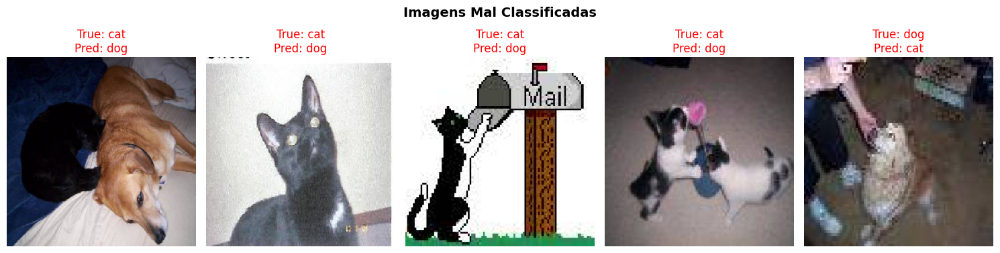

In [ ]:
# funcionalidade 2: mostrar erros de classificação (aviso: é necessário dar load aos modelos)

def display_misclassified_images(model, test_gen, num_images=5, target_size=(224,224)):
    test_gen.reset()

    # predict
    predictions = model.predict(test_gen_224)
    predicted_classes = (predictions > 0.5).astype("int32").flatten()
    true_classes = test_gen.classes

    # procurar index das classificações erradas
    misclassified_idxs = np.where(predicted_classes != true_classes)[0]

    if len(misclassified_idxs) == 0:
        print("Nenhuma imagem mal classificada encontrada!")
        return

    print(f"Número total de imagens mal classificadas: {len(misclassified_idxs)} \n")
    num_images = min(num_images, len(misclassified_idxs))

    # verificar se gerador possui os caminhos das imagens
    if not hasattr(test_gen, 'filepaths'):
        print("O gerador de teste não possui 'filepaths'. Adapte o código para carregar as imagens.")
        return

    # cria os subplots para exibição das imagens
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5))
    for i, idx in enumerate(misclassified_idxs[:num_images]):
        # carrega a imagem original redimensionada para o tamanho especificado
        img_path = test_gen.filepaths[idx]
        img = load_img(img_path, target_size=target_size)
        img_array = img_to_array(img) / 255.0  # Normaliza para [0, 1]

        # escolhe o eixo correto
        ax = axes[i] if num_images > 1 else axes
        ax.imshow(img_array)
        ax.axis("off")

        # converte as classes numéricas para "cat" e "dog"
        pred_label = 'dog' if predicted_classes[idx] == 1 else 'cat'
        true_label = 'dog' if true_classes[idx] == 1 else 'cat'
        color = 'green' if pred_label == true_label else 'red'

        ax.set_title(f"True: {true_label}\nPred: {pred_label}", color=color)

    plt.suptitle("Imagens Mal Classificadas", fontsize=14, fontweight='bold', y=0.9)
    plt.tight_layout()
    plt.show()

print("\nAnálise de Imagens Mal Classificadas (EfficientNet_v3.2):")
display_misclassified_images(modelo_effnet, test_gen_224, num_images=5)

# Conclusões

O presente trabalho teve como objetivo o desenvolvimento de um classificador binário capaz de distinguir entre imagens de cães e gatos, utilizando um conjunto de dados fornecido com imagens organizadas por categoria. Desta maneira, foram exploradas duas abordagens distintas no que concerne à implementação de redes neuronais e visão computacional: a construção de um modelo de redes neuronais convolucionais (CNN) desenvolvido de raiz e a utilização de modelos pré-treinados através da técnica de Transfer Learning.

O notebook foi organizado em partes que seguem e ilustram o processo de resolução do problema, dividido em várias etapas: introdução, preparação dos dados, criação de funções auxiliares (para facilitar a leitura e manutenção do código durante o treino e avaliação dos modelos), implementação do TensorBoard, descrição e implementação das arquiteturas, comparação entre modelos,  features adicionais, e por fim, a conclusão.

A monitorização contínua do desempenho dos modelos, quer através do output dos treinos quer via TensorBoard, foi crucial para compreender o comportamento das arquiteturas e realizar os ajustes necessários. Através da abordagem comparativa verificou-se uma melhoria progressiva ao longo dos modelos. Para além disso, a comparação final das métricas possibilitou uma análise clara do desempenho das versões mais eficazes de cada abordagem.

A aplicação dos modelos pré-treinados revelou-se particularmente eficaz. A técnica de Transfer Learning demonstrou resultados bastante superiores em comparação à CNN construída de raiz. Esta última, na sua melhor versão (versão 4), atingiu uma precisão de 85%. Em contrapartida, a versão 3.2 do modelo EfficientNetB0, destacou-se pela sua elevada eficiência, alcançando uma precisão de 99,5% em apenas cinco épocas de treino. O modelo EfficientNetB0 apenas classificou incorretamente cinco imagens — uma das quais continha simultaneamente um cão e um gato, o que justifica parcialmente a confusão do modelo. É de salientar que este resultado impressionante evidencia o forte trade-off entre eficiência e desempenho, e demonstra a rápida capacidade de aprendizagem do modelo pré-treinado para a tarefa de classificação de cães e gatos.

Para além da construção dos modelos, foram também implementadas duas features adicionais: a visualização das previsões realizadas pelo modelo e a identificação das imagens incorretamente classificadas.

Para trabalhos futuros, seria interessante explorar o fine-tuning de algumas camadas do EfficientNetB0 com o objetivo de obter ganhos marginais de precisão. Adicionalmente, poderá ser vantajoso investigar outras arquiteturas de modelos pré-treinados, comparando a sua eficiência e desempenho nesta tarefa específica de classificação de imagens.

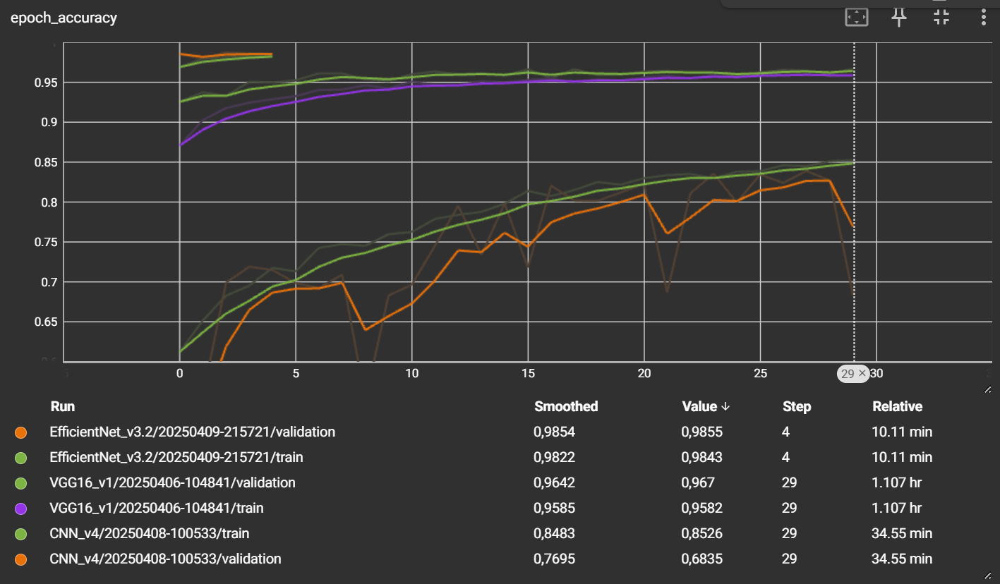
Fonte: TensorBoard